<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:32px;font-weight:bold;font-family:Arial,sans-serif;">
        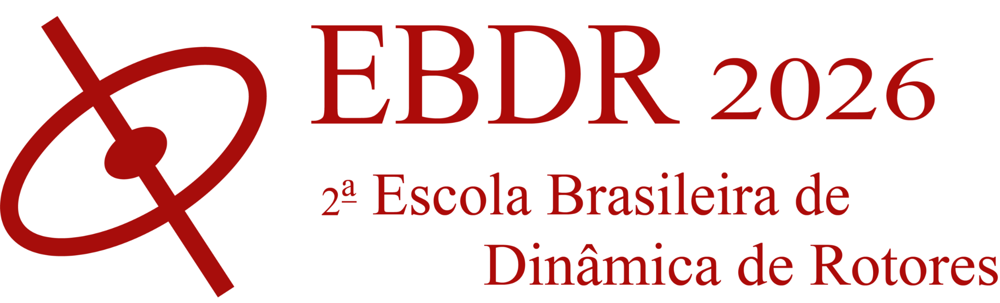&nbsp;&nbsp;Modelagem de Rotor Flexível
    </span>
</div>

<!-- # Modelagem de Rotor Flexível DTU - 12 Elementos
-->

**Modelagem, Análise Modal, Diagrama de Campbell, Resposta no Tempo e Resposta a DesbalanceamentoResposta**

**Referência:** MACHINERY DYNAMICS LECTURES (41514) - MEK/DTU - Prof. Ilmar Ferreira Santos

**Resultados experimentais de referência:** 13.0, 14.9, 33.6, 43.0, 46.0 Hz.

Discretização em 12 elementos → modelo mais compacto

<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        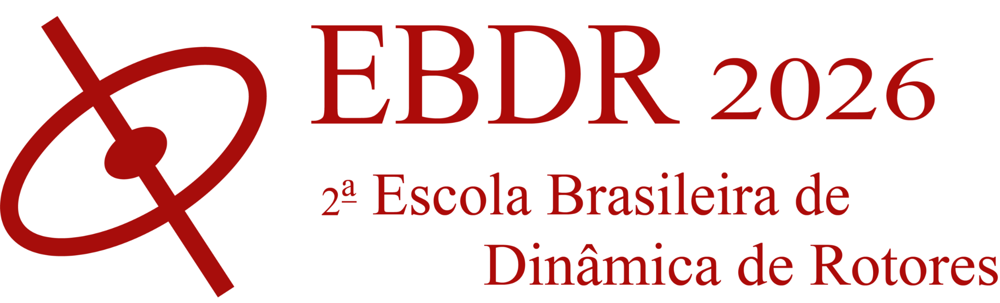&nbsp;&nbsp; Introdução teórica
    </span>
</div>

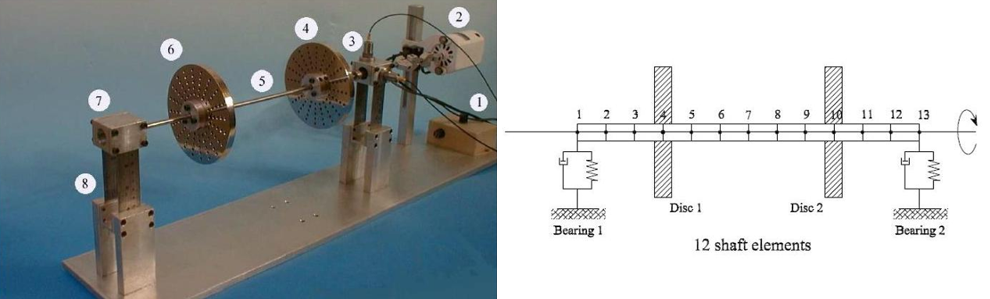

O modelo representa um rotor flexível por elementos finitos de eixo, com dois discos e dois conjuntos de mancais. A análise modal determina as frequências naturais e os modos de vibração do sistema linearizado.

A formulação de rotor é feita utilizando o **ROSS (Rotordynamic Open-Source Software)**, que considera os graus de liberdade associados aos nós.

Os cinco valores experimentais de referência do ensaio DTU são **13.0 Hz, 14.9 Hz, 33.6 Hz, 43.0 Hz e 46.0 Hz**.


In [1]:
import sys
sys.path.append(r"C:\Users\Murillo\Documents\ROSS\ross_230\ross")

import ross as rs
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy import linalg as la
from ross.utils import convert_6dof_to_4dof



c:\Users\Murillo\Documents\Venv\VENV_Engrenamento\lib\site-packages\ccp\__init__.py:92: UserWarning: Unable to set REFPROP path due to non-ASCII characters in path: c:\Users\Murillo\OneDrive - Universidade Federal de Uberlândia\Área de Trabalho\EBDR\artigo\ebdr2026\aula\jupyter\V2\V3
CoolProp does not support non-ASCII characters in paths. Consider renaming the directory or using an ASCII-only path.
Proceeding without setting REFPROP path.
  _warnings.warn(
c:\Users\Murillo\Documents\Venv\VENV_Engrenamento\lib\site-packages\ccp\__init__.py:120: UserWarning: c:\Users\Murillo\OneDrive - Universidade Federal de Uberlândia\Área de Trabalho\EBDR\artigo\ebdr2026\aula\jupyter\V2\V3\REFPRP64.DLL.
REFPROP not configured. Automatically switching to EOS='HEOS' (CoolProp backend).
  _warnings.warn(
c:\Users\Murillo\Documents\Venv\VENV_Engrenamento\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stab

<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        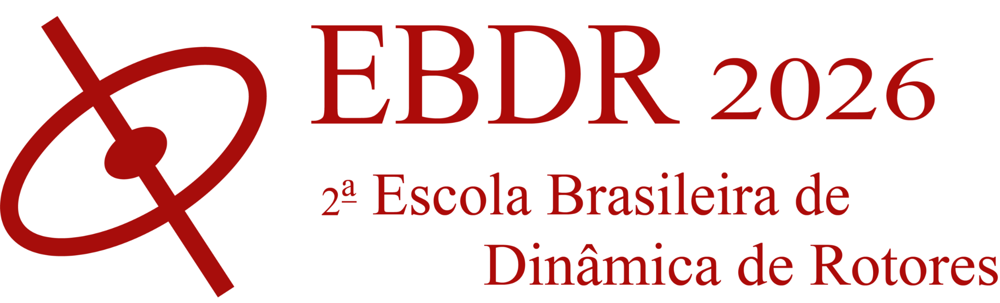&nbsp;&nbsp;Parâmetros
    </span>
</div>

In [2]:
# Número de elementos finitos que discretizam o eixo.
NE = 24

# Número de discos montados no rotor.
ND = 2

# Número de mancais ou suportes considerados no modelo.
NM = 2

# Nós dos discos, posicionados proporcionalmente ao número de elementos.
CD1 = round(NE * 0.25)
CD2 = round(NE * 0.75)

# Nó de referência associado ao mancal 1.
CMM1 = 0

# Nó de referência associado ao mancal 2.
CMM2 = NE

# Nós dos suportes dos mancais.
HOUSING1 = NE + 1
HOUSING2 = NE + 2

# Velocidade angular de rotação do rotor em rad/s.
Omega = 0.0

print("NE =", NE)
print("Discos nos nós:", CD1, CD2)
print("Mancais nos nós:", CMM1, CMM2)
print("Housing:", HOUSING1, HOUSING2)


NE = 24
Discos nos nós: 6 18
Mancais nos nós: 0 24
Housing: 25 26


<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        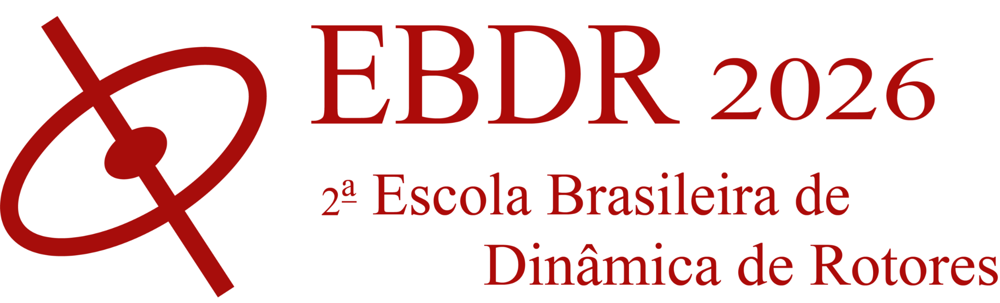&nbsp;&nbsp;Materiais
    </span>
</div>

In [3]:
# Definição dos Materiais

# Módulo de elasticidade do material do eixo e dos elementos estruturais.
E = 2.0e11
# Densidade do aço.
RAco = 7800
# Densidade do alumínio.
RAl = 2770

aluminum = rs.Material(
    name="aluminum",
    rho=2770,
    E=70e9,
    G_s=27e9,
)

steel = rs.Material(
    name="steel_DTU",
    rho=7800,
    E=2e11,
    G_s=8.0e10,
)


<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        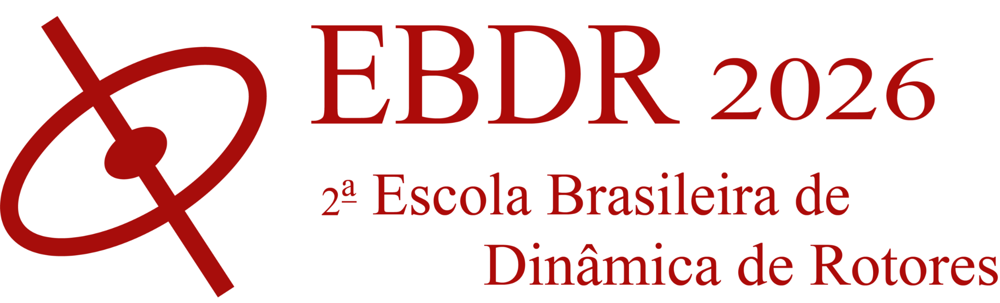&nbsp;&nbsp;Elementos de eixo
    </span>
</div>

In [4]:
# Raio externo do eixo.
Rext = 0.0025
# Raio interno do eixo.
Rint = 0.0

# Comprimento das três regiões do eixo.
L1 = 0.140
L2 = 0.205
L3 = 0.090

# Número de elementos em cada região do eixo.
NE1 = round(NE * 3 / 12)
NE2 = round(NE * 6 / 12)
NE3 = NE - NE1 - NE2

# Vetor de comprimentos de cada elemento finito do eixo.
l = np.zeros(NE)

# Comprimento dos elementos da primeira região.
l[:NE1] = L1 / NE1

# Comprimento dos elementos da segunda região.
l[NE1:NE1 + NE2] = L2 / NE2

# Comprimento dos elementos da terceira região.
l[NE1 + NE2:] = L3 / NE3

# Definição dos elementos de eixo.
shaft_elements = [
    rs.ShaftElement(
        L=l[i],
        idl=2 * Rint,
        odl=2 * Rext,
        material=steel,
        n=i,
        shear_effects=True,
        rotary_inertia=True,
        gyroscopic=True,
    )
    for i in range(NE)
]

# Apresentação das informações do eixo.
print(f"Comprimento total do eixo: {np.sum(l):.4f} m")
print(f"Número de elementos: {len(shaft_elements)}")
print(f"Elementos na região 1: {NE1}")
print(f"Elementos na região 2: {NE2}")
print(f"Elementos na região 3: {NE3}")


Comprimento total do eixo: 0.4350 m
Número de elementos: 24
Elementos na região 1: 6
Elementos na região 2: 12
Elementos na região 3: 6


<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        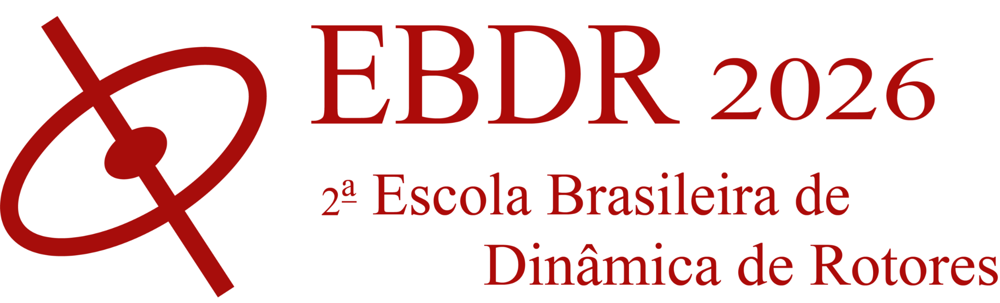&nbsp;&nbsp;Discos maciços
    </span>
</div>

In [5]:
# Raio externo dos discos.
Rd = 0.06
# Espessura axial dos discos.
espD = 0.011
# Raio interno dos discos.
Ri = 0.0

# Massa de cada disco, calculada a partir de sua geometria e densidade.
MasD = np.pi * Rd**2 * espD * RAl

# Momento de inércia de massa transversal de cada disco.
Id = 1 / 4 * MasD * Rd**2 + 1 / 12 * MasD * espD**2

# Momento de inércia de massa polar de cada disco.
Ip = 1 / 2 * MasD * Rd**2

# Definição dos discos
disk1 = rs.DiskElement(
    n=CD1,
    m=MasD,
    Id=Id,
    Ip=Ip,
)

disk2 = rs.DiskElement.from_geometry(
    n=CD2,
    material=aluminum,
    width=espD,
    i_d=0,
    o_d=2 * Rd,
)

# Comparação dos parâmetros dos discos
print("\n")
print(f"{'Parameter':<25} {'Disk 1':>18} {'Disk 2':>18}")
print("-" * 65)
print(f"{'Mass [kg]':<25}{disk1.m:>18.6f}{disk2.m:>18.6f}")
print(f"{'Id [kg.m^2]':<25}{disk1.Id:>18.8f}{disk2.Id:>18.8f}")
print(f"{'Ip [kg.m^2]':<25}{disk1.Ip:>18.8f}{disk2.Ip:>18.8f}")
print("-" * 65)



Parameter                             Disk 1             Disk 2
-----------------------------------------------------------------
Mass [kg]                          0.344608          0.344608
Id [kg.m^2]                      0.00031362        0.00031362
Ip [kg.m^2]                      0.00062029        0.00062029
-----------------------------------------------------------------


<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        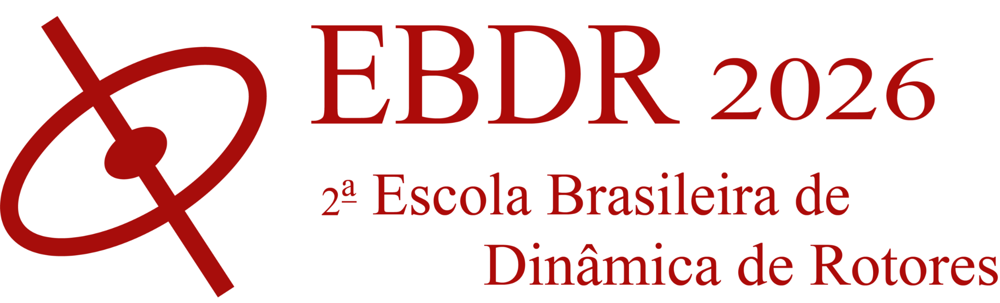&nbsp;&nbsp;Mancais
    </span>
</div>

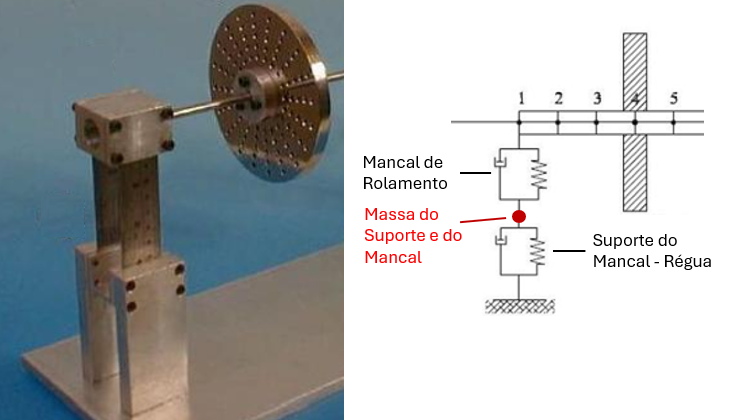

In [6]:
# Massa associada a cada mancal e suporte.
MasM = 0.40698
# Espessura da seção transversal do suporte do mancal.
h = 0.001
# Largura da seção transversal do suporte do mancal.
b = 0.0285
# Comprimento característico do suporte flexível do mancal.
lr = 0.075

# Área da seção transversal do suporte do mancal.
Area = b * h
I_beam = b * h**3 / 12

# Rigidez translacional inicial do suporte na direção x.
Ktx0 = 2 * 12 * E * I_beam / lr**3
# Rigidez translacional inicial do suporte na direção y.
Kty0 = 2 * E * Area / lr

# Definição dos Mancais e Suportes
bearing1 = rs.BearingElement(
    n=CMM1,
    n_link=HOUSING1,
    kxx=0,
    kyy=0,
    cxx=0.0,
    cyy=0.0,
)

support1 = rs.BearingElement(
    n=HOUSING1,
    kxx=Ktx0,
    kyy=Kty0,
    cxx=0.0,
    cyy=0.0,
)

bearing2 = rs.BearingElement(
    n=CMM2,
    n_link=HOUSING2,
    kxx=0,
    kyy=0,
    cxx=0.0,
    cyy=0.0,
)

support2 = rs.BearingElement(
    n=HOUSING2,
    kxx=Ktx0,
    kyy=Kty0,
    cxx=0.0,
    cyy=0.0,
)

print(f"Ktx0 = {Ktx0:.2f} N/m")
print(f"Kty0 = {Kty0:.2f} N/m")

Ktx0 = 27022.22 N/m
Kty0 = 152000000.00 N/m


<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        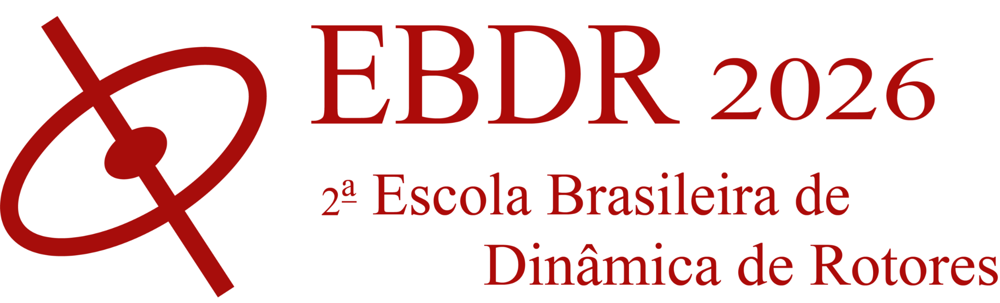&nbsp;&nbsp;Montagem do Rotor
    </span>
</div>

In [15]:
# Ponto de Massa do suporte do mancal

point_mass1 = rs.PointMass(n=HOUSING1, m=MasM)
point_mass2 = rs.PointMass(n=HOUSING2, m=MasM)

##########################
disk_aux1 = rs.DiskElement(
    n=CMM1,
    m=MasM,
    Id=0,
    Ip=0,
)

disk_aux2 = rs.DiskElement(
    n=CMM2,
    m=MasM,
    Id=0,
    Ip=0,
)

# Definição dos Mancais e Suportes
bearing1 = rs.BearingElement(
    n=CMM1,
    kxx=Ktx0,
    kyy=Kty0,
    cxx=0.0,
    cyy=0.0,
)

bearing2 = rs.BearingElement(
    n=CMM2,
    kxx=Ktx0,
    kyy=Kty0,
    cxx=0.0,
    cyy=0.0,
)

##########################

rotor = rs.Rotor(
    shaft_elements,
    [disk1, disk2, disk_aux1, disk_aux2],
    # [bearing1, support1, bearing2, support2],
    [bearing1, bearing2],
    # [point_mass1, point_mass2],
)

# rotor_4dof = convert_6dof_to_4dof(rotor)
rotor_4dof = rotor
print("Rotor montado.")
print("Nós:", len(rotor.nodes))
print("DOFs do modelo original:", rotor.ndof)
print("DOFs do modelo 4 DOF:", rotor_4dof.ndof)

rotor.plot_rotor(nodes=999).show()


Rotor montado.
Nós: 25
DOFs do modelo original: 150
DOFs do modelo 4 DOF: 150


<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        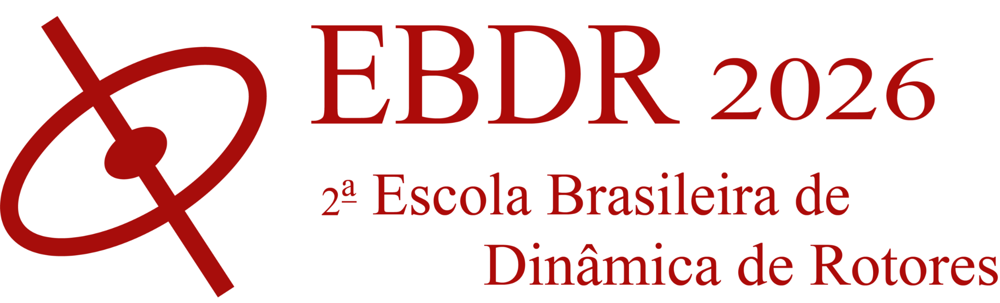&nbsp;&nbsp;Análise modal
    </span>
</div>

In [18]:
modal = rotor_4dof.run_modal(speed=Omega, num_modes=24)

wn_hz = modal.wn / (2 * np.pi)

print("Modos naturais:")

for i, freq in enumerate(wn_hz):
    print(f"  Modo {i}: {freq:.2f} Hz - {2*np.pi*freq:.2f} rad/s")

for mode_num in range(len(wn_hz)):
    fig = modal.plot_mode_3d(mode=mode_num, frequency_units="Hz")

    # fig.update_layout(
    #     title=f"Modo {mode_num + 1} - f={wn_hz[mode_num]:.2f} Hz"
    # )

    fig.show()

Modos naturais:
  Modo 0: 13.86 Hz - 87.09 rad/s
  Modo 1: 14.71 Hz - 92.42 rad/s
  Modo 2: 33.52 Hz - 210.62 rad/s
  Modo 3: 42.32 Hz - 265.89 rad/s
  Modo 4: 44.22 Hz - 277.84 rad/s
  Modo 5: 46.73 Hz - 293.61 rad/s
  Modo 6: 56.26 Hz - 353.47 rad/s
  Modo 7: 130.81 Hz - 821.90 rad/s
  Modo 8: 133.30 Hz - 837.56 rad/s
  Modo 9: 168.64 Hz - 1059.62 rad/s
  Modo 10: 171.24 Hz - 1075.92 rad/s
  Modo 11: 560.97 Hz - 3524.70 rad/s


<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        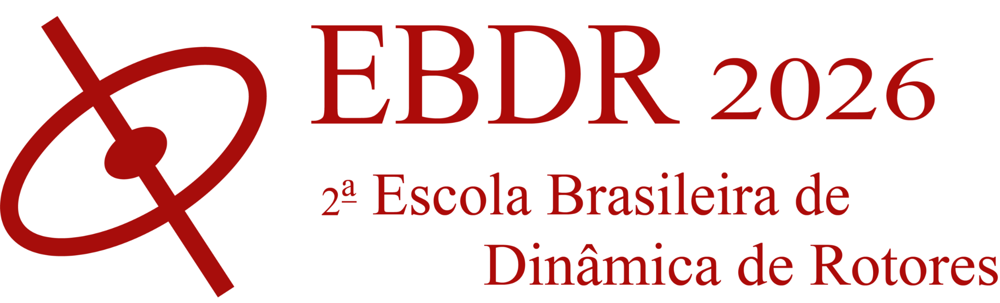&nbsp;&nbsp;Diagrama de Campbell
    </span>
</div>

In [10]:
speed_range = np.linspace(0, 160 * 2 * np.pi, 150)

campbell = rotor_4dof.run_campbell(speed_range)

campbell.plot(
    frequency_units="Hz",
    speed_units="Hz",
).show()

In [ ]:
break

<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        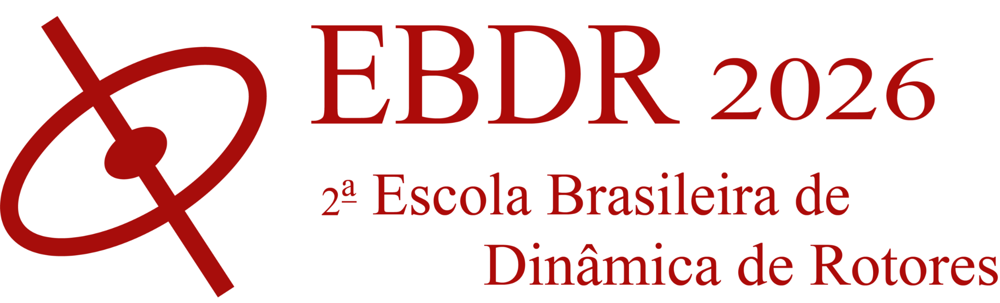&nbsp;&nbsp;Velocidades críticas
    </span>
</div>

In [ ]:
modal = rotor_4dof.run_modal(speed=Omega)

wn_hz = np.real(modal.wn) / (2 * np.pi)

critical_rpm = wn_hz * 60

print("\nCritical speeds / natural frequencies")
print("-" * 45)

for mode, (freq_hz, speed_rpm) in enumerate(
    zip(wn_hz, critical_rpm),
    start=1
):
    print(
        f"Mode {mode:2d}: "
        f"Frequency = {freq_hz:8.2f} Hz | "
        f"Speed = {speed_rpm:8.2f} rpm"
    )


<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        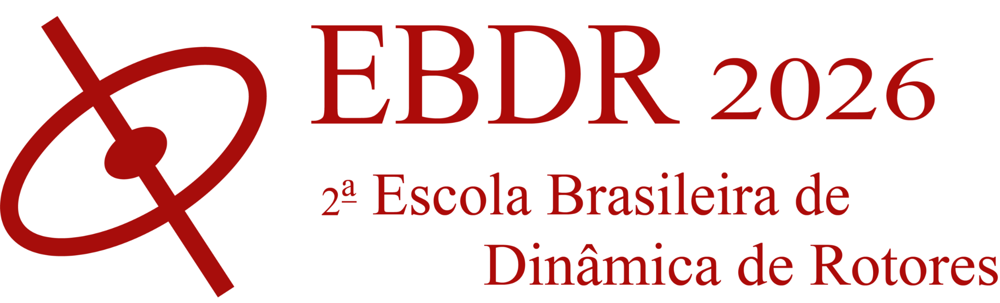&nbsp;&nbsp;Resposta em frequência (FRF)
    </span>
</div>

In [ ]:
omega = np.linspace(0.1, 500, 500)

freq_resp = rotor_4dof.run_freq_response(
    speed_range=omega
)

freq_resp.plot_magnitude(inp=25, out=25).show()
freq_resp.plot_phase(inp=25, out=25).show()
freq_resp.plot_polar_bode(inp=25, out=25).show()


<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        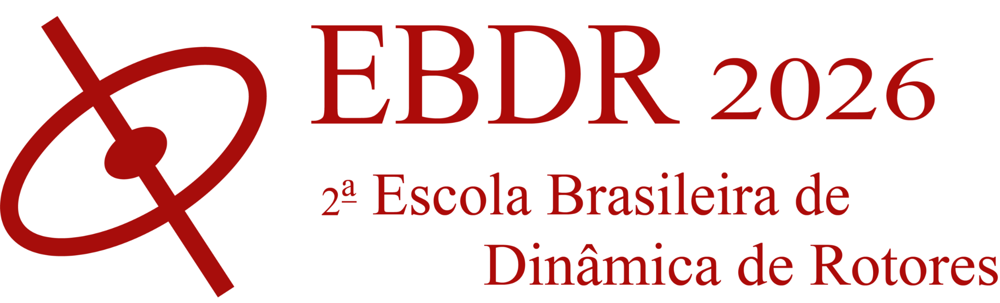&nbsp;&nbsp;Resposta a desbalanceamento
    </span>
</div>

In [ ]:

rpm = np.linspace(0, 3000, 500)
omega = rpm * 2 * np.pi / 60

unb_resp = rotor_4dof.run_unbalance_response(
    [3, 9],
    [0.001, 0.001],
    [0, 0],
    omega,
)


probe_3 = rs.Probe(
    node=3,
    angle=0,
    direction="radial",
    tag="Probe 3",
)


unb_resp.plot_magnitude(
    probe=[probe_3]
).show()


unb_resp.plot_bode(
    probe=[probe_3]
).show()


speed = omega[50]

print(f"Velocidade utilizada na forma defletida:")
print(f"  {speed:.2f} rad/s")
print(f"  {speed * 60 / (2 * np.pi):.2f} rpm")

unb_resp.plot_deflected_shape(
    speed=speed
).show()

<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        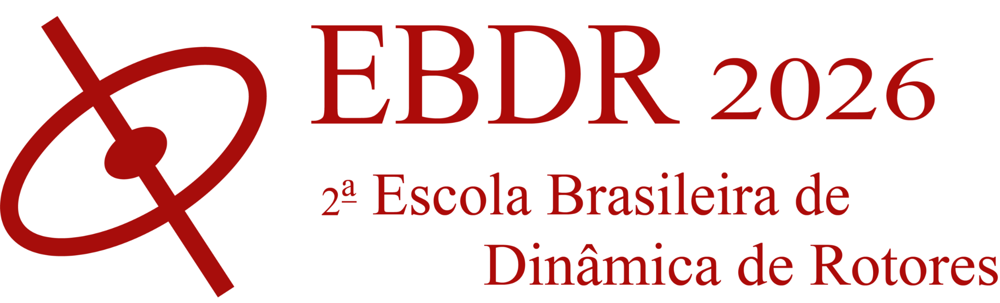&nbsp;&nbsp;Resposta no tempo
    </span>
</div>

In [ ]:
speed = 100 * 2 * np.pi / 60

# Vetor de tempo da simulação.
t = np.linspace(0, 10, 10001)

F = np.zeros(
    (len(t), rotor_4dof.ndof),
    dtype=float,
)

time_resp = rotor_4dof.run_time_response(
    speed,
    F,
    t,
    method="newmark",
)

probe_3 = rs.Probe(
    node=3,
    angle=0,
    direction="radial",
    tag="Probe 3",
)

time_resp.plot_1d(
    probe=[probe_3]
).show()

time_resp.plot_dfft(
    probe=[probe_3]
).show()

<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        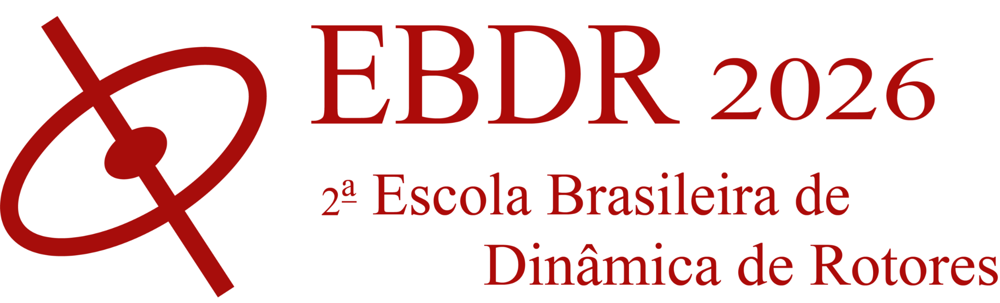&nbsp;&nbsp;Tabela de validação
    </span>
</div>

In [ ]:
experimental = np.array([13.0, 14.9, 33.6, 43.0, 46.0])

validation = pd.DataFrame({
    "Experimental (Hz)": experimental,
    "ROSS (Hz)": wn_hz[:5],
})

validation["Erro absoluto (Hz)"] = (
    validation["ROSS (Hz)"] - validation["Experimental (Hz)"]
).abs()

validation["Erro relativo (
    validation["Erro absoluto (Hz)"]
    / validation["Experimental (Hz)"]
    * 100
)

validation


**Valores experimentais de referência:** 13.0, 14.9, 33.6, 43.0, 46.0 Hz

A tabela acima permite avaliar quantitativamente a concordância entre o modelo numérico e o ensaio DTU.


<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        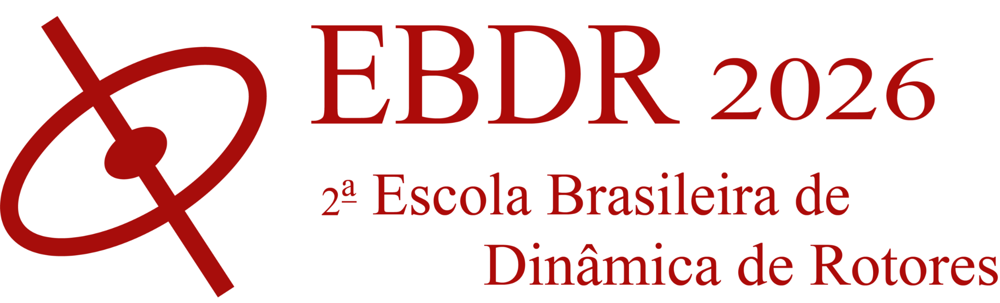&nbsp;&nbsp;Atividades
    </span>
</div>

As atividades a seguir foram organizadas para consolidar a interpretação física dos resultados e a utilização do modelo ROSS.

<div style="
    background:#ffffff;
    border:4px solid #ffffff;
    border-radius:8px;
    padding:16px;
    font-family:Arial,sans-serif;">
    <h3>Atividades</h3>
<ol>
<li>Execute a análise modal e identifique os cinco primeiros modos associados à faixa experimental.</li>
<li>Compare cada frequência numérica com os valores experimentais de 13.0, 14.9, 33.6, 43.0 e 46.0 Hz.</li>
<li>Calcule o erro relativo de cada frequência e indique qual modo apresenta a maior discrepância.</li>
<li>Observe o diagrama de Campbell e identifique as regiões em que as linhas de excitação podem cruzar as frequências naturais.</li>
<li>Na resposta a desbalanceamento, explique por que a amplitude cresce nas proximidades das velocidades críticas.</li>
<li>Compare a discretização deste modelo com uma malha mais grosseira e discuta a influência do número de elementos sobre os modos superiores.</li>
</ol>
</div>

<div style="
    display:flex;
    align-items:center;
    background:linear-gradient(90deg, #ffffff, #ffffff);
    border-left:8px solid #c00000;
    width:99%;
    padding:10px 14px;
    border-radius:8px;
    box-sizing:border-box;
    margin:0 0 -10px 0;">
    <span style="color:#c00000;font-size:24px;font-weight:bold;font-family:Arial,sans-serif;">
        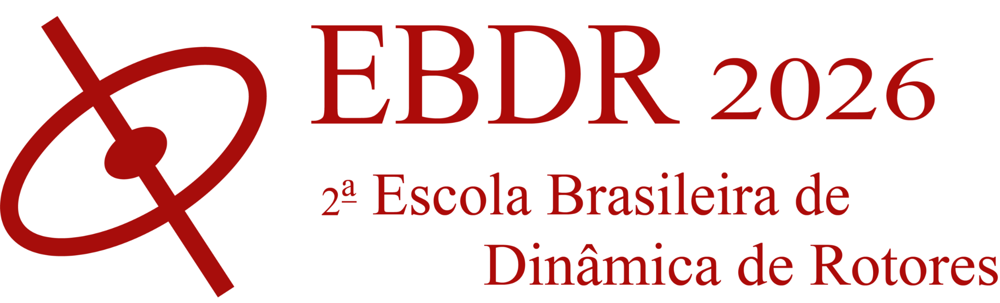&nbsp;&nbsp;Gabarito
    </span>
</div>

<div style="
    background:#fafafa;
    border:1px solid #ddd;
    border-radius:8px;
    padding:16px;
    font-family:Arial,sans-serif;">
    <h3>Gabarito orientativo</h3>
<p><b>1.</b> Execute <code>run_modal</code> e utilize <code>wn_hz</code> para listar as frequências naturais. A identificação dos modos deve ser feita pela proximidade com os valores experimentais e pela inspeção das formas modais.</p>
<p><b>2.</b> Os valores de referência são 13.0, 14.9, 33.6, 43.0 e 46.0 Hz. A comparação deve ser feita modo a modo, respeitando a ordem das frequências.</p>
<p><b>3.</b> Use <code>|f_num - f_exp| / f_exp × 100</code>. O maior valor corresponde ao pior ajuste relativo.</p>
<p><b>4.</b> No Campbell, velocidades críticas aparecem associadas aos cruzamentos entre as frequências naturais dependentes da velocidade e as linhas de excitação de ordem 1×, 2× etc.</p>
<p><b>5.</b> Próximo de uma ressonância, a função de resposta dinâmica apresenta aumento de amplitude devido à proximidade entre a frequência de excitação e uma frequência natural do sistema.</p>
<p><b>6.</b> O refinamento da malha aumenta a capacidade do modelo de representar curvaturas espaciais mais complexas. Por isso, a convergência dos modos superiores tende a ser particularmente sensível ao número de elementos.</p>
<p><b>Observação:</b> os resultados numéricos exatos dependem da versão do ROSS e do ambiente em que o notebook for executado; portanto, o gabarito deve ser interpretado em termos do procedimento e da tendência física esperada.</p>
</div>